In [380]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels.api as sm
from sklearn import preprocessing 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import classification_report

In [270]:
data = pd.read_csv('C:\\Users\\infoa\Dropbox\\PC\\Downloads\\Capstron Project Axis Bank\\Data In Csv Format\\1642065009_Dev Bureau  Info Affordable Home Loans (2).csv')

In [271]:
data.head()

,Dummy_application_id,ever60_24m_StrictFlag,All_No_of_TL,All_open_TL,All_Vin_bureau,All_min_Vin_bureau,AL_No_of_TL,AL_open_TL,HL_No_of_TL,HL_open_TL,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,0,4,2,32,2,-9999,-9999,-9999,-9999,...,-9999.000000,-9999.0,0.5,0.25,-9999.0,-9999.0,-9999.0,-8888,-9999,2.<6 CC
1,4670001,0,3,1,65,19,1,1,2,-999,...,0.666667,-9999.0,-9999.0,-9999.00,-9999.0,-9999.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,0,2,2,47,37,1,1,-9999,-9999,...,-9999.000000,-9999.0,-9999.0,-9999.00,0.5,0.5,0.5,-8888,-9999,12.>36 PL TWL GL
3,4670395,0,2,1,94,69,1,-999,-9999,-9999,...,-9999.000000,-9999.0,-9999.0,-9999.00,-9999.0,-9999.0,0.5,-8888,-9999,13.>36 Others
4,4670451,0,1,-999,87,87,-9999,-9999,-9999,-9999,...,-9999.000000,-9999.0,-9999.0,-9999.00,-9999.0,-9999.0,-9999.0,-8888,-9999,11.>36 CC


In [272]:
data.isnull().sum()

Dummy_application_id     0
ever60_24m_StrictFlag    0
All_No_of_TL             0
All_open_TL              0
All_Vin_bureau           0
                        ..
prn_BL_trd               0
prn_Sec_C_trd            0
ALL_Alg_max_delq_24m     0
HL_Alg_max_delq_12m      0
Bureau_TL                0
Length: 105, dtype: int64

In [273]:
data.columns

Index(['Dummy_application_id', 'ever60_24m_StrictFlag', 'All_No_of_TL',
       'All_open_TL', 'All_Vin_bureau', 'All_min_Vin_bureau', 'AL_No_of_TL',
       'AL_open_TL', 'HL_No_of_TL', 'HL_open_TL',
       ...
       'prn_HL_trd', 'prn_PL_trd', 'prn_CL_trd', 'prn_TWL_trd',
       'prn_BL_PSL_trd', 'prn_BL_trd', 'prn_Sec_C_trd', 'ALL_Alg_max_delq_24m',
       'HL_Alg_max_delq_12m', 'Bureau_TL'],
      dtype='object', length=105)

In [274]:
data.groupby('All_open_TL')['All_open_TL'].agg('count')

All_open_TL
-999    2516
 1      4952
 2      2533
 3      1334
 4       830
 5       468
 6       270
 7       188
 8       103
 9        71
 10       42
 11       25
 12       28
 13       10
 14        8
 15        2
 16        3
 17        4
 18        9
 19        2
 20        2
 21        1
 22        2
 23        2
 24        1
 29        1
 34        1
 159       1
Name: All_open_TL, dtype: int64

In [275]:
data['All_open_TL'] = data['All_open_TL'].replace(-999,0)

In [276]:
data.groupby('All_open_TL')['All_open_TL'].agg('count')

All_open_TL
0      2516
1      4952
2      2533
3      1334
4       830
5       468
6       270
7       188
8       103
9        71
10       42
11       25
12       28
13       10
14        8
15        2
16        3
17        4
18        9
19        2
20        2
21        1
22        2
23        2
24        1
29        1
34        1
159       1
Name: All_open_TL, dtype: int64

In [277]:
data.groupby('All_Vin_bureau')['All_Vin_bureau'].agg('count')

All_Vin_bureau
0        1
1       57
2      135
3      158
4      161
      ... 
264      1
300      1
309      1
313      1
444      1
Name: All_Vin_bureau, Length: 223, dtype: int64

In [278]:
data.groupby('All_min_Vin_bureau')['All_min_Vin_bureau'].agg('count')

All_min_Vin_bureau
0       17
1      385
2      848
3      891
4      747
      ... 
190      1
192      1
216      1
226      1
300      1
Name: All_min_Vin_bureau, Length: 157, dtype: int64

In [279]:
data.groupby('AL_No_of_TL')['AL_No_of_TL'].agg('count')

AL_No_of_TL
-9999    11031
 1        1750
 2         441
 3         116
 4          34
 5          21
 6           8
 7           4
 8           1
 9           1
 13          1
 21          1
Name: AL_No_of_TL, dtype: int64

In [280]:
data['AL_No_of_TL'] = data['AL_No_of_TL'].replace(-9999,0)

In [281]:
data.groupby('AL_No_of_TL')['AL_No_of_TL'].agg('count')

AL_No_of_TL
0     11031
1      1750
2       441
3       116
4        34
5        21
6         8
7         4
8         1
9         1
13        1
21        1
Name: AL_No_of_TL, dtype: int64

In [282]:
data.groupby('AL_open_TL')['AL_open_TL'].agg('count')

AL_open_TL
-9999    11031
-999       752
 1        1378
 2         206
 3          29
 4           9
 5           1
 6           2
 16          1
Name: AL_open_TL, dtype: int64

In [283]:
data['AL_open_TL']=data['AL_open_TL'].replace(-9999,0)

In [284]:
data['AL_open_TL']=data['AL_open_TL'].replace(-999,0)

In [285]:
data.groupby('AL_open_TL')['AL_open_TL'].agg('count')

AL_open_TL
0     11783
1      1378
2       206
3        29
4         9
5         1
6         2
16        1
Name: AL_open_TL, dtype: int64

In [286]:
data.groupby('HL_No_of_TL')['HL_No_of_TL'].agg('count')

HL_No_of_TL
-9999    11508
 1        1392
 2         353
 3          82
 4          44
 5          14
 6           8
 7           6
 8           2
Name: HL_No_of_TL, dtype: int64

In [287]:
data['HL_No_of_TL']=data['HL_No_of_TL'].replace(-9999,0)

In [288]:
data.groupby('HL_No_of_TL')['HL_No_of_TL'].agg('count')

HL_No_of_TL
0    11508
1     1392
2      353
3       82
4       44
5       14
6        8
7        6
8        2
Name: HL_No_of_TL, dtype: int64

In [289]:
data.groupby('HL_No_of_TL')['HL_No_of_TL'].agg('count')

HL_No_of_TL
0    11508
1     1392
2      353
3       82
4       44
5       14
6        8
7        6
8        2
Name: HL_No_of_TL, dtype: int64

In [290]:
Category =[]

for i in data:
    if data[i].dtype == 'object':
        Category.append(i)

In [291]:
for col in data:
    if col not in Category:
        data.loc[(data[col] < 0), col] = 0

In [292]:
data

,Dummy_application_id,ever60_24m_StrictFlag,All_No_of_TL,All_open_TL,All_Vin_bureau,All_min_Vin_bureau,AL_No_of_TL,AL_open_TL,HL_No_of_TL,HL_open_TL,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,0,4,2,32,2,0,0,0,0,...,0.000000,0.00,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,4670001,0,3,1,65,19,1,1,2,0,...,0.666667,0.00,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,0,2,2,47,37,1,1,0,0,...,0.000000,0.00,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,4670395,0,2,1,94,69,1,0,0,0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4670451,0,1,0,87,87,0,0,0,0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,1,0,39,39,0,0,0,0,...,0.000000,0.00,1.0,0.00,0.0,0.0,0.0,0,0,13.>36 Others
13405,14213879,0,4,2,49,4,0,0,0,0,...,0.000000,0.25,0.5,0.00,0.0,0.0,0.0,0,0,4.<6 BL CL Oth
13406,14214403,0,1,1,50,50,0,0,1,1,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others
13407,14214413,0,1,1,50,50,0,0,1,1,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others


In [293]:
data_Burea = data

In [294]:
data_Burea1 = data_Burea.drop('ever60_24m_StrictFlag',axis=1)
data_Burea1

,Dummy_application_id,All_No_of_TL,All_open_TL,All_Vin_bureau,All_min_Vin_bureau,AL_No_of_TL,AL_open_TL,HL_No_of_TL,HL_open_TL,PL_No_of_TL,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,4,2,32,2,0,0,0,0,0,...,0.000000,0.00,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,4670001,3,1,65,19,1,1,2,0,0,...,0.666667,0.00,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,2,2,47,37,1,1,0,0,0,...,0.000000,0.00,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,4670395,2,1,94,69,1,0,0,0,0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4670451,1,0,87,87,0,0,0,0,0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,1,0,39,39,0,0,0,0,0,...,0.000000,0.00,1.0,0.00,0.0,0.0,0.0,0,0,13.>36 Others
13405,14213879,4,2,49,4,0,0,0,0,1,...,0.000000,0.25,0.5,0.00,0.0,0.0,0.0,0,0,4.<6 BL CL Oth
13406,14214403,1,1,50,50,0,0,1,1,0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others
13407,14214413,1,1,50,50,0,0,1,1,0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others


In [295]:
data_Burea.head()

,Dummy_application_id,ever60_24m_StrictFlag,All_No_of_TL,All_open_TL,All_Vin_bureau,All_min_Vin_bureau,AL_No_of_TL,AL_open_TL,HL_No_of_TL,HL_open_TL,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,0,4,2,32,2,0,0,0,0,...,0.000000,0.0,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,4670001,0,3,1,65,19,1,1,2,0,...,0.666667,0.0,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,0,2,2,47,37,1,1,0,0,...,0.000000,0.0,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,4670395,0,2,1,94,69,1,0,0,0,...,0.000000,0.0,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4670451,0,1,0,87,87,0,0,0,0,...,0.000000,0.0,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC


In [296]:
data_Liability = pd.read_csv('C:\\Users\\infoa\\Dropbox\\PC\\Downloads\\Capstron Project Axis Bank\\Data In Csv Format\\1642065131_Dev Liability Info Affordable Home Loans (1).csv')

In [297]:
data_Liability

,Dummy_application_id,ever60_24m_StrictFlag,Application_vintage,avrg_bal_12m,min_bal_6m,C_variation_6m,C_variation_9m,C_variation_12m,Max_Min_Bal_ratio_9m,NW_ATM_D_AMT_6m,...,Prn_NW_DIGI_D_AMT_12m,Prn_NW_ATM_D_AMT_12m,Prn_NW_NEFT_IMPS_D_AMT_12m,Prn_NW_FT_D_AMT_12m,Prn_NW_CASH_C_AMT_12m,Prn_NW_CHEQUE_C_AMT_12m,Prn_NW_NEFT_IMPS_C_AMT_12m,Prn_NW_BRN_C_AMT_12m,Unnamed: 50,Unnamed: 51
0,4667539,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
1,4670001,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
2,4670389,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
3,4670395,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
4,4670451,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
13405,14213879,0,101,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,NaN,NaN
13406,14214403,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN
13407,14214413,0,-11111,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,...,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,-11111.0,NaN,NaN


<AxesSubplot:>

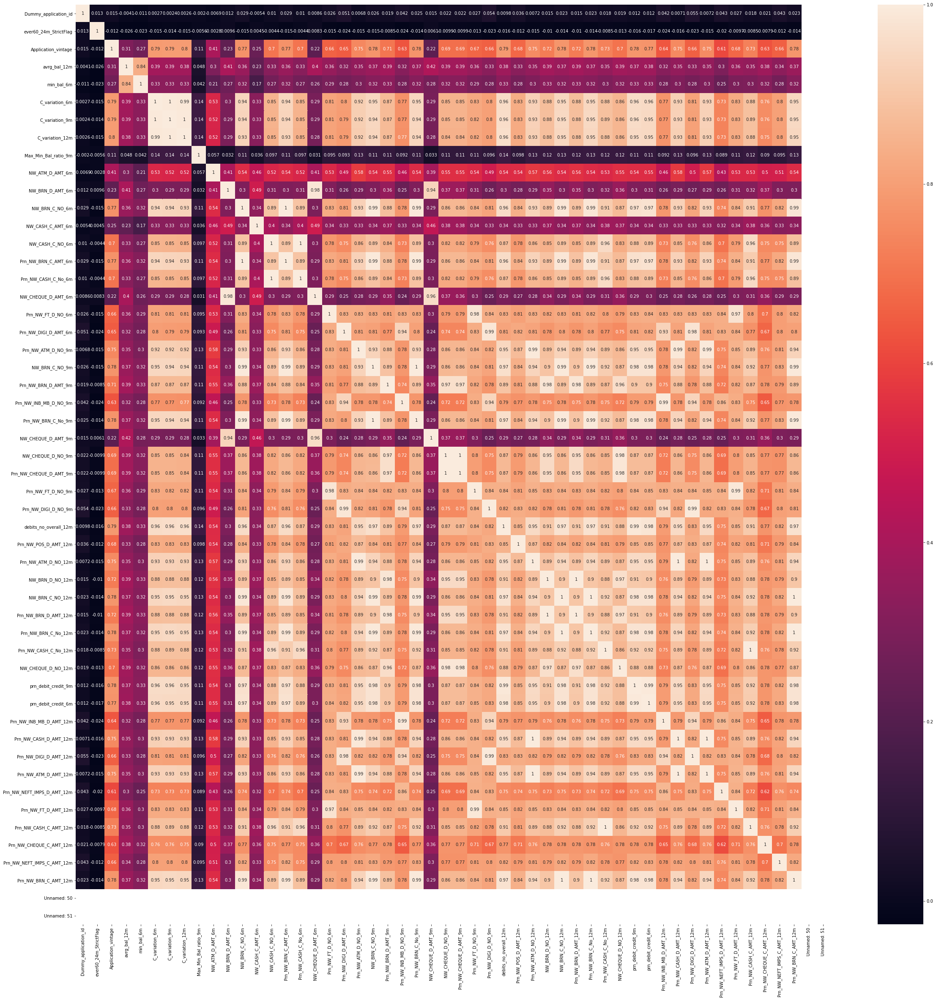

In [298]:
plt.figure(figsize=(40,40))

sns.heatmap(data_Liability.corr(), annot=True)

In [299]:
Category =[]

for i in data_Liability:
    if data_Liability[i].dtype == 'object':
        Category.append(i)

In [300]:
for col in data_Liability:
    if col not in Category:
        data_Liability.loc[(data_Liability[col] < 0), col] = 0

In [301]:
data_Liability

,Dummy_application_id,ever60_24m_StrictFlag,Application_vintage,avrg_bal_12m,min_bal_6m,C_variation_6m,C_variation_9m,C_variation_12m,Max_Min_Bal_ratio_9m,NW_ATM_D_AMT_6m,...,Prn_NW_DIGI_D_AMT_12m,Prn_NW_ATM_D_AMT_12m,Prn_NW_NEFT_IMPS_D_AMT_12m,Prn_NW_FT_D_AMT_12m,Prn_NW_CASH_C_AMT_12m,Prn_NW_CHEQUE_C_AMT_12m,Prn_NW_NEFT_IMPS_C_AMT_12m,Prn_NW_BRN_C_AMT_12m,Unnamed: 50,Unnamed: 51
0,4667539,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
1,4670001,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2,4670389,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3,4670395,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
4,4670451,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13405,14213879,0,101,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13406,14214403,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13407,14214413,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [302]:
data_Liability.groupby('Max_Min_Bal_ratio_9m')['Max_Min_Bal_ratio_9m'].agg('count')

Max_Min_Bal_ratio_9m
0.000000e+00    10741
1.000000e+00       80
1.003898e+00        1
1.005184e+00        1
1.006515e+00        1
                ...  
6.097436e+04        1
1.056369e+05        1
2.116145e+06        1
2.413622e+06        1
3.036378e+06        1
Name: Max_Min_Bal_ratio_9m, Length: 2557, dtype: int64

In [303]:
data_Liability.shape

(13409, 52)

In [304]:
data_Demog = pd.read_csv('C:\\Users\\infoa\\Dropbox\\PC\\Downloads\\Capstron Project Axis Bank\\Data In Csv Format\\1642064946_Dev Demog Info Affordable Home Loans.csv')

In [305]:
data_Demog

,Dummy_application_id,ever60_24m_StrictFlag,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,...,PROPERTY_INSURANCE_AMT,Organization_type,SALARIED_SELF,CHANNEL_CODE,City_tier,FOIR2,Loan_sub_type_1,SAL_FLAG,emi_income_max,emi_income_sum
0,4667539,0,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,0.0,...,4553.0,3.Private Ltd Co,SALARIED,DSA,1,NaN,Builder Ready,SAL,0.456037,0.456037
1,4670001,0,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,0.0,...,10307.0,3.Private Ltd Co,SELF_EMP,DSA,3,47.261108,Self Construction,NONSAL,0.472611,0.472611
2,4670389,0,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,0.0,...,7460.0,3.Private Ltd Co,SELF_EMP,CROSS SALES,3,48.668441,Self Construction,NONSAL,0.486684,0.486684
3,4670395,0,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,0.0,...,6744.0,1.Others,SALARIED,DSA,1,44.759877,Builder UNC,SAL,0.447599,0.447599
4,4670451,0,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,0.0,...,0.0,3.Private Ltd Co,SALARIED,UBL Sales,1,61.915915,Builder Ready,SAL,0.619159,0.619159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,0.0,...,35343.0,4.Public Ltd. Co.,SALARIED,CROSS SALES,1,30.000000,Resale Ready,SAL,0.307412,0.307412
13405,14213879,0,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,0.0,...,0.0,3.Private Ltd Co,SALARIED,DSA,3,46.000000,Builder Ready,SAL,0.460021,0.460021
13406,14214403,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,0.0,...,5597.0,3.Private Ltd Co,SELF_EMP,UBL Sales,2,42.000000,Resale Ready,NONSAL,0.440446,0.440446
13407,14214413,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,0.0,...,0.0,3.Private Ltd Co,SELF_EMP,UBL Sales,2,61.000000,Resale Ready,NONSAL,0.145836,0.145836


In [306]:
data_Demog.shape

(13409, 26)

In [307]:
data_Demog1 = data_Demog.drop('ever60_24m_StrictFlag',axis=1)

In [308]:
data_Demog1

,Dummy_application_id,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,edu_max,...,PROPERTY_INSURANCE_AMT,Organization_type,SALARIED_SELF,CHANNEL_CODE,City_tier,FOIR2,Loan_sub_type_1,SAL_FLAG,emi_income_max,emi_income_sum
0,4667539,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,0.0,3,...,4553.0,3.Private Ltd Co,SALARIED,DSA,1,NaN,Builder Ready,SAL,0.456037,0.456037
1,4670001,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,0.0,3,...,10307.0,3.Private Ltd Co,SELF_EMP,DSA,3,47.261108,Self Construction,NONSAL,0.472611,0.472611
2,4670389,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,0.0,3,...,7460.0,3.Private Ltd Co,SELF_EMP,CROSS SALES,3,48.668441,Self Construction,NONSAL,0.486684,0.486684
3,4670395,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,0.0,3,...,6744.0,1.Others,SALARIED,DSA,1,44.759877,Builder UNC,SAL,0.447599,0.447599
4,4670451,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,0.0,3,...,0.0,3.Private Ltd Co,SALARIED,UBL Sales,1,61.915915,Builder Ready,SAL,0.619159,0.619159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,0.0,3,...,35343.0,4.Public Ltd. Co.,SALARIED,CROSS SALES,1,30.000000,Resale Ready,SAL,0.307412,0.307412
13405,14213879,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,0.0,3,...,0.0,3.Private Ltd Co,SALARIED,DSA,3,46.000000,Builder Ready,SAL,0.460021,0.460021
13406,14214403,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,0.0,2,...,5597.0,3.Private Ltd Co,SELF_EMP,UBL Sales,2,42.000000,Resale Ready,NONSAL,0.440446,0.440446
13407,14214413,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,0.0,2,...,0.0,3.Private Ltd Co,SELF_EMP,UBL Sales,2,61.000000,Resale Ready,NONSAL,0.145836,0.145836


In [309]:
Demog_Liability = pd.merge(data_Demog,data_Liability, on=['Dummy_application_id'], how ='left' )

In [310]:
Demog_Liability

,Dummy_application_id,ever60_24m_StrictFlag_x,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,...,Prn_NW_DIGI_D_AMT_12m,Prn_NW_ATM_D_AMT_12m,Prn_NW_NEFT_IMPS_D_AMT_12m,Prn_NW_FT_D_AMT_12m,Prn_NW_CASH_C_AMT_12m,Prn_NW_CHEQUE_C_AMT_12m,Prn_NW_NEFT_IMPS_C_AMT_12m,Prn_NW_BRN_C_AMT_12m,Unnamed: 50,Unnamed: 51
0,4667539,0,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
1,4670001,0,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2,4670389,0,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3,4670395,0,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
4,4670451,0,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13405,14213879,0,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13406,14214403,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
13407,14214413,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [311]:
Demog_Liability_Burea = pd.merge(Demog_Liability,data_Burea1, on=['Dummy_application_id'], how ='left' )

In [312]:
Demog_Liability_Burea

,Dummy_application_id,ever60_24m_StrictFlag_x,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,0,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,0.0,...,0.000000,0.00,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,4670001,0,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,0.0,...,0.666667,0.00,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,0,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,0.0,...,0.000000,0.00,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,4670395,0,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,0.0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4670451,0,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,0.0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13404,14213505,0,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,0.0,...,0.000000,0.00,1.0,0.00,0.0,0.0,0.0,0,0,13.>36 Others
13405,14213879,0,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,0.0,...,0.000000,0.25,0.5,0.00,0.0,0.0,0.0,0,0,4.<6 BL CL Oth
13406,14214403,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,0.0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others
13407,14214413,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,0.0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others


In [313]:
Demog_Liability_Burea.shape

(13409, 180)

In [314]:
Demog_Liability_Burea.drop(['Unnamed: 51','Unnamed: 50'],axis=1,inplace=True)

<AxesSubplot:>

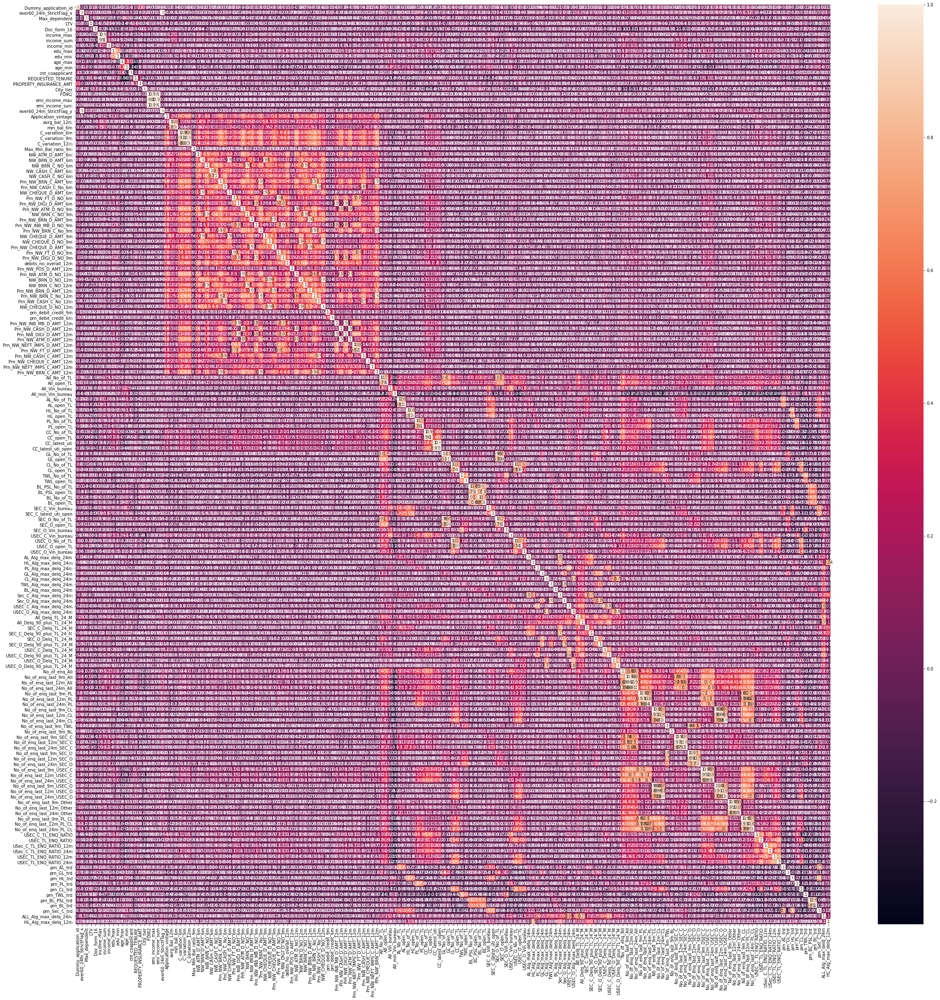

In [226]:
plt.figure(figsize=(40,40))

sns.heatmap(Demog_Liability_Burea.corr(), annot=True)

In [227]:
import os
os.chdir('C:/Users/infoa/Dropbox/PC/Downloads/Capstron Project Axis Bank/Data In Csv Format')
Demog_Liability_Burea.to_csv('merge1.csv')

PermissionError: [Errno 13] Permission denied: 'merge1.csv'

In [315]:
Demog_Liability_Burea.isnull().sum()

Dummy_application_id        0
ever60_24m_StrictFlag_x     0
NATURE_OF_ORGANISATION     64
OCCUPATION_TYPE            69
Max_dependent               0
                           ..
prn_BL_trd                  0
prn_Sec_C_trd               0
ALL_Alg_max_delq_24m        0
HL_Alg_max_delq_12m         0
Bureau_TL                   0
Length: 178, dtype: int64

In [316]:
data = Demog_Liability_Burea

In [317]:
data.describe()

,Dummy_application_id,ever60_24m_StrictFlag_x,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,edu_max,edu_min,...,prn_GL_trd,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m
count,1.340900e+04,13409.000000,13409.000000,12869.000000,13409.000000,1.338400e+04,1.338400e+04,1.338400e+04,13409.000000,13409.000000,...,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000,13409.000000
mean,9.035097e+06,0.073085,1.239839,0.605774,0.276382,3.594421e+04,3.973012e+04,3.893080e+03,2.752480,2.275636,...,0.084614,0.064120,0.071109,0.194301,0.173508,0.039683,0.056144,0.138490,0.835260,0.022298
std,2.756184e+06,0.260286,1.366872,0.191422,0.447224,8.448169e+04,8.540767e+04,1.546474e+04,0.805406,0.818712,...,0.232627,0.199238,0.189809,0.313105,0.313145,0.161355,0.189545,0.278491,2.482593,0.297706
min,4.667539e+06,0.000000,0.000000,0.009176,0.000000,-1.373667e+03,-1.169056e+05,-1.169056e+05,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.727229e+06,0.000000,0.000000,0.479989,0.000000,1.994875e+04,2.173950e+04,0.000000e+00,2.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8.807985e+06,0.000000,1.000000,0.626418,0.000000,2.534933e+04,2.828333e+04,0.000000e+00,3.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.057082e+07,0.000000,2.000000,0.767087,1.000000,3.474527e+04,4.035131e+04,0.000000e+00,3.000000,3.000000,...,0.000000,0.000000,0.000000,0.333333,0.250000,0.000000,0.000000,0.142857,0.000000,0.000000
max,1.421457e+07,1.000000,52.000000,4.762585,1.000000,5.500000e+06,5.521000e+06,1.411964e+06,4.000000,4.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,13.000000,13.000000


In [318]:
data.columns

Index(['Dummy_application_id', 'ever60_24m_StrictFlag_x',
       'NATURE_OF_ORGANISATION', 'OCCUPATION_TYPE', 'Max_dependent', 'LTV',
       'Doc_form_16', 'income_max', 'income_sum', 'income_min',
       ...
       'prn_HL_trd', 'prn_PL_trd', 'prn_CL_trd', 'prn_TWL_trd',
       'prn_BL_PSL_trd', 'prn_BL_trd', 'prn_Sec_C_trd', 'ALL_Alg_max_delq_24m',
       'HL_Alg_max_delq_12m', 'Bureau_TL'],
      dtype='object', length=178)

In [319]:
data['LTV'] = data['LTV'].fillna(data['LTV'].mean())

In [320]:
data['LTV'].isnull().sum()

0

In [321]:
data['income_max'] = data['income_max'].fillna(data['income_max'].mean())

In [322]:
data['income_sum'] = data['income_sum'].fillna(data['income_sum'].mean())

In [323]:
data['income_min'] = data['income_min'].fillna(data['income_min'].mean())

In [324]:
data['FOIR2'] = data['FOIR2'].fillna(data['FOIR2'].median())

In [325]:
data['emi_income_max'] = data['emi_income_max'].fillna(data['emi_income_max'].median())

In [326]:
data['emi_income_sum'] = data['emi_income_sum'].fillna(data['emi_income_sum'].median())

In [327]:
data.isnull().sum().sum()

133

In [328]:
data = data.dropna().reset_index()

In [329]:
data

,index,Dummy_application_id,ever60_24m_StrictFlag_x,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,0,4667539,0,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,...,0.000000,0.00,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,1,4670001,0,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,...,0.666667,0.00,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,2,4670389,0,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,...,0.000000,0.00,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,3,4670395,0,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4,4670451,0,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13333,13404,14213505,0,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,...,0.000000,0.00,1.0,0.00,0.0,0.0,0.0,0,0,13.>36 Others
13334,13405,14213879,0,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,...,0.000000,0.25,0.5,0.00,0.0,0.0,0.0,0,0,4.<6 BL CL Oth
13335,13406,14214403,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others
13336,13407,14214413,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others


In [330]:
data=data.drop('index',axis=1)

In [331]:
data

,Dummy_application_id,ever60_24m_StrictFlag_x,NATURE_OF_ORGANISATION,OCCUPATION_TYPE,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,...,prn_HL_trd,prn_PL_trd,prn_CL_trd,prn_TWL_trd,prn_BL_PSL_trd,prn_BL_trd,prn_Sec_C_trd,ALL_Alg_max_delq_24m,HL_Alg_max_delq_12m,Bureau_TL
0,4667539,0,Private Ltd. Co.,SALARIED,0,0.715563,0,11396.0000,11396.0000,0.0,...,0.000000,0.00,0.5,0.25,0.0,0.0,0.0,0,0,2.<6 CC
1,4670001,0,Proprietor-Proprietorship Firm (Staff Less tha...,SELF-EMPLOYED,2,0.544463,0,26472.0833,26472.0833,0.0,...,0.666667,0.00,0.0,0.00,0.0,0.0,1.0,2,2,7.<36 AL HL LAS
2,4670389,0,Proprietor-Proprietorship Firm (Staff Less tha...,SERVICES,6,0.566012,0,23487.5000,23487.5000,0.0,...,0.000000,0.00,0.0,0.00,0.5,0.5,0.5,0,0,12.>36 PL TWL GL
3,4670395,0,Others,SALARIED,0,0.536455,0,42270.0000,42270.0000,0.0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.5,0,0,13.>36 Others
4,4670451,0,Private Ltd. Co.,SERV-PRIVATE SECTOR,1,0.511949,0,17506.0000,17506.0000,0.0,...,0.000000,0.00,0.0,0.00,0.0,0.0,0.0,0,0,11.>36 CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13333,14213505,0,Public Ltd. Co.,SALARIED,3,0.797220,0,41202.0000,41202.0000,0.0,...,0.000000,0.00,1.0,0.00,0.0,0.0,0.0,0,0,13.>36 Others
13334,14213879,0,Proprietor-Proprietorship Firm (Staff Less tha...,SALARIED,1,0.799787,0,61858.0000,61858.0000,0.0,...,0.000000,0.25,0.5,0.00,0.0,0.0,0.0,0,0,4.<6 BL CL Oth
13335,14214403,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.506137,0,30616.6850,30616.6850,0.0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others
13336,14214413,0,Proprietor-Proprietorship Firm (Staff More tha...,TRADING,0,0.155070,0,30616.6850,30616.6850,0.0,...,1.000000,0.00,0.0,0.00,0.0,0.0,1.0,0,0,13.>36 Others


In [332]:
data['Dummy_application_id']

0         4667539
1         4670001
2         4670389
3         4670395
4         4670451
           ...   
13333    14213505
13334    14213879
13335    14214403
13336    14214413
13337    14214567
Name: Dummy_application_id, Length: 13338, dtype: int64

In [333]:
data.columns

Index(['Dummy_application_id', 'ever60_24m_StrictFlag_x',
       'NATURE_OF_ORGANISATION', 'OCCUPATION_TYPE', 'Max_dependent', 'LTV',
       'Doc_form_16', 'income_max', 'income_sum', 'income_min',
       ...
       'prn_HL_trd', 'prn_PL_trd', 'prn_CL_trd', 'prn_TWL_trd',
       'prn_BL_PSL_trd', 'prn_BL_trd', 'prn_Sec_C_trd', 'ALL_Alg_max_delq_24m',
       'HL_Alg_max_delq_12m', 'Bureau_TL'],
      dtype='object', length=178)

In [235]:
os.chdir('C:/Users/infoa/Dropbox/PC/Downloads/Capstron Project Axis Bank/Data In Csv Format')

In [236]:
data.to_csv('clean1_merge1.csv')

PermissionError: [Errno 13] Permission denied: 'clean1_merge1.csv'

In [334]:
data.drop('ever60_24m_StrictFlag_y',axis=1,inplace=True)

In [335]:
data.shape

(13338, 177)

<AxesSubplot:>

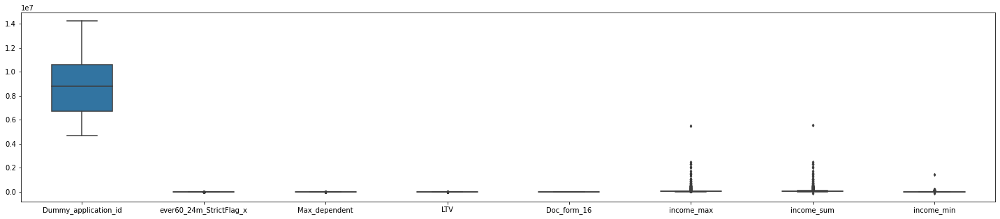

In [336]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,0:10],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

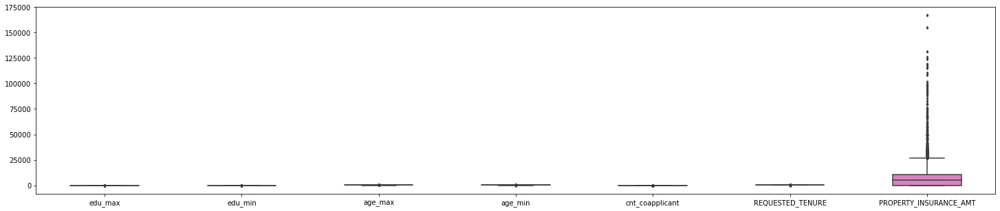

In [337]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,10:20],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

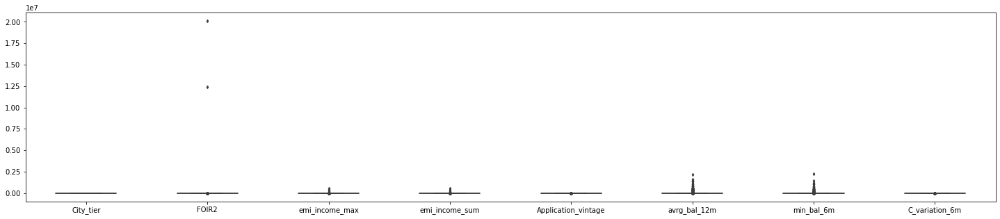

In [338]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,20:30],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

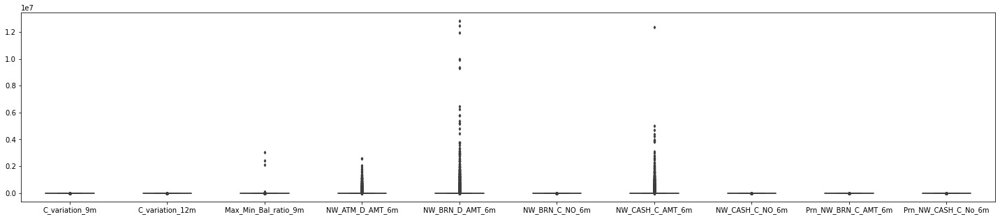

In [339]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,30:40],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

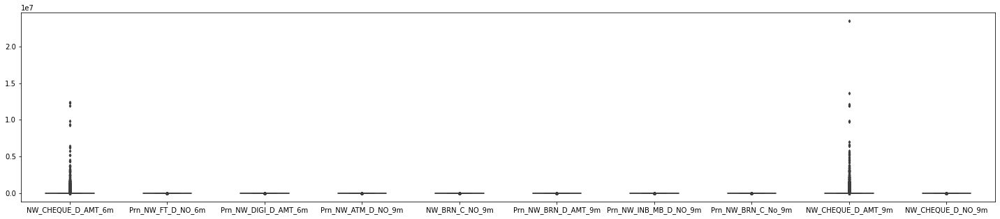

In [340]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,40:50],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

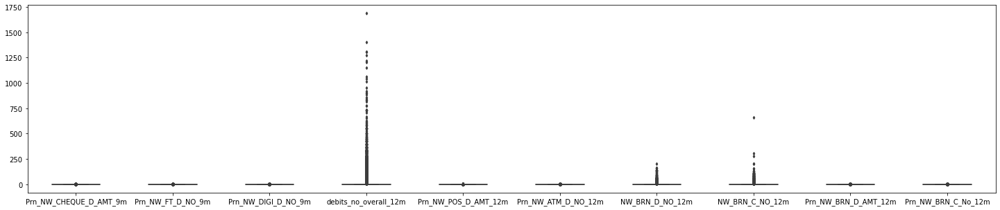

In [341]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,50:60],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

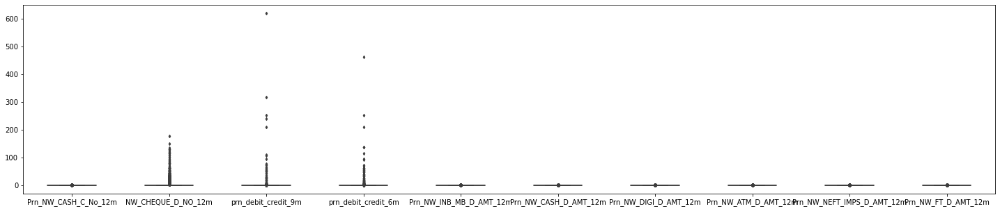

In [342]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,60:70],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

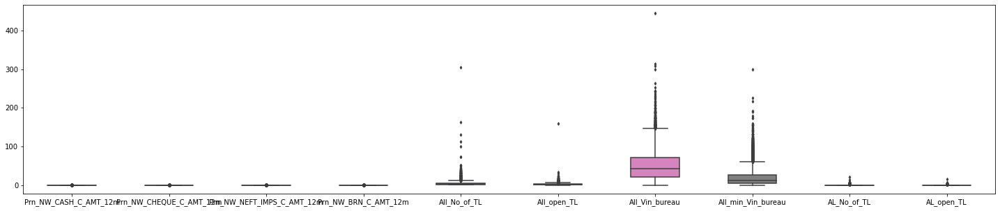

In [343]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,70:80],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

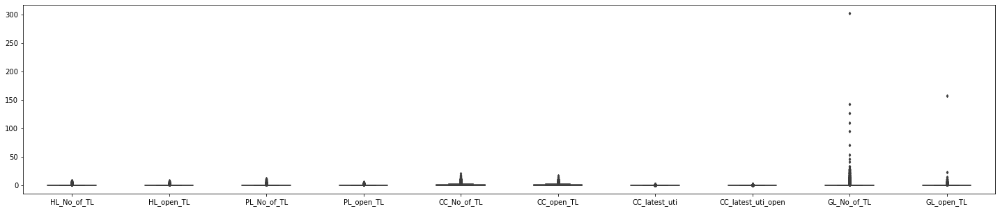

In [344]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,80:90],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

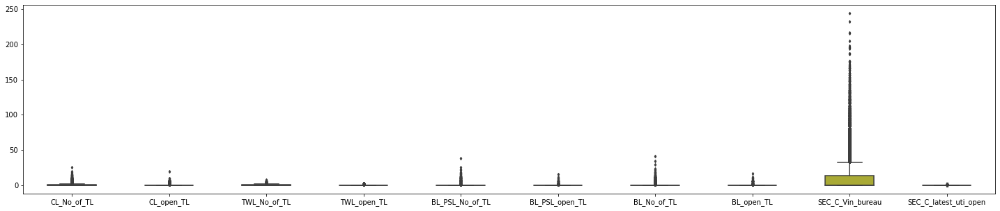

In [345]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,90:100],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

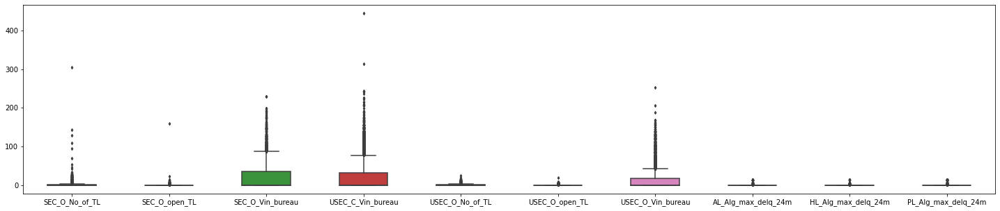

In [346]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,100:110],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

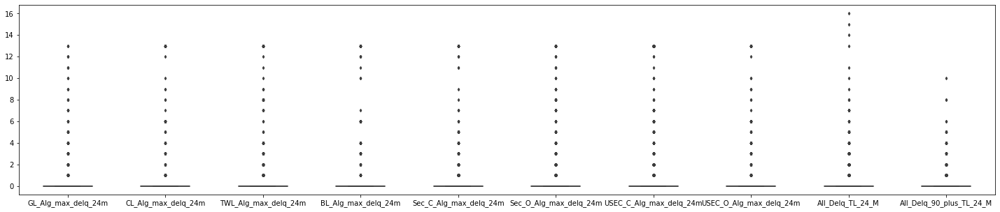

In [347]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,110:120],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

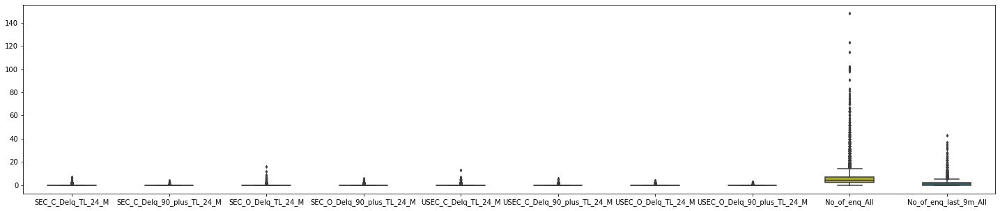

In [348]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,120:130],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

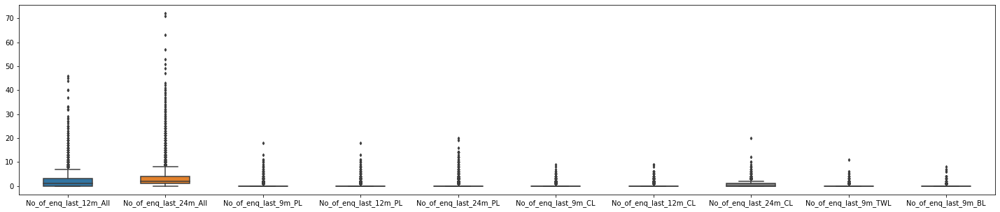

In [349]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,130:140],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

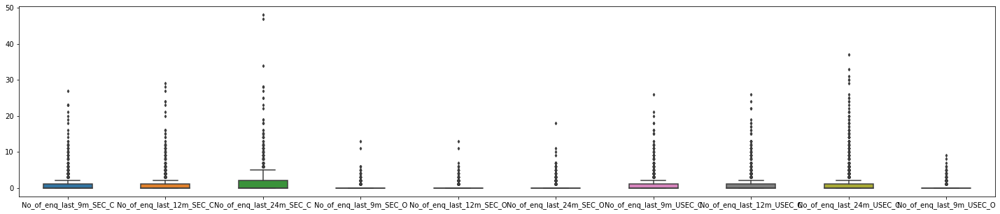

In [350]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,140:150],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

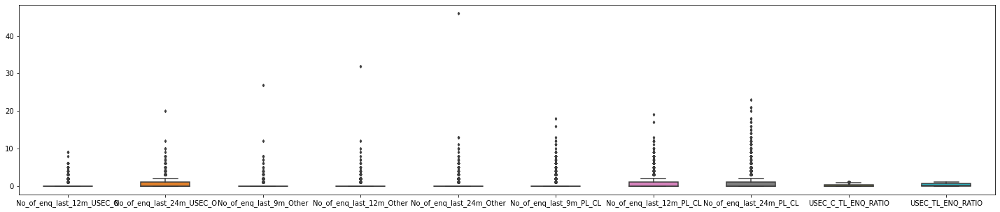

In [351]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,150:160],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

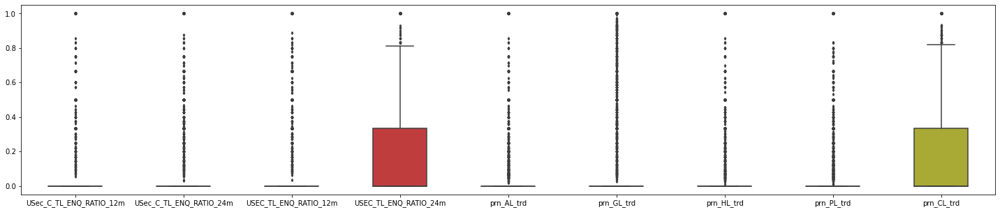

In [352]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,160:170],width=0.5,ax=ax, fliersize=3)

<AxesSubplot:>

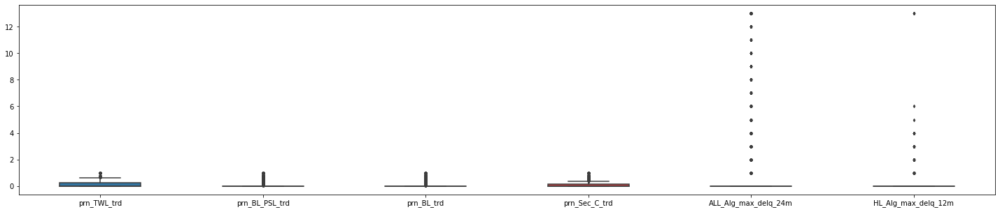

In [353]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data.iloc[:,170:180],width=0.5,ax=ax, fliersize=3)

In [366]:
q = data['PROPERTY_INSURANCE_AMT'].quantile(0.95)

data_cleaned = data[data['PROPERTY_INSURANCE_AMT'] < q]

q = data['NW_BRN_D_AMT_6m'].quantile(0.95)

data_cleaned = data[data['NW_BRN_D_AMT_6m'] < q]

q = data['FOIR2'].quantile(0.95)

data_cleaned = data[data['FOIR2'] < q]

q = data['NW_CASH_C_AMT_6m'].quantile(0.95)

data_cleaned = data[data['NW_CASH_C_AMT_6m'] < q]

q = data['NW_CHEQUE_D_AMT_6m'].quantile(0.95)

data_cleaned = data[data['NW_CHEQUE_D_AMT_6m'] < q]

q = data['NW_CHEQUE_D_AMT_9m'].quantile(0.95)

data_cleaned = data[data['NW_CHEQUE_D_AMT_9m'] < q]

q = data['debits_no_overall_12m'].quantile(0.95)

data_cleaned = data[data['debits_no_overall_12m'] < q]

q = data['NW_BRN_C_NO_12m'].quantile(0.95)

data_cleaned = data[data['NW_BRN_C_NO_12m'] < q]

q = data['prn_debit_credit_9m'].quantile(0.95)

data_cleaned = data[data['prn_debit_credit_9m'] < q]

q = data['prn_debit_credit_6m'].quantile(0.95)

data_cleaned = data[data['prn_debit_credit_6m'] < q]

q = data['All_No_of_TL'].quantile(0.95)

data_cleaned = data[data['All_No_of_TL'] < q]

q = data['All_min_Vin_bureau'].quantile(0.95)

data_cleaned = data[data['All_min_Vin_bureau'] < q]

q = data['GL_No_of_TL'].quantile(0.95)

data_cleaned = data[data['GL_No_of_TL'] < q]

q = data['SEC_C_Vin_bureau'].quantile(0.95)

data_cleaned = data[data['SEC_C_Vin_bureau'] < q]

q = data['USEC_C_Vin_bureau'].quantile(0.95)

data_cleaned = data[data['USEC_C_Vin_bureau'] < q]

q = data['No_of_enq_All'].quantile(0.95)

data_cleaned = data[data['No_of_enq_All'] < q]

<AxesSubplot:>

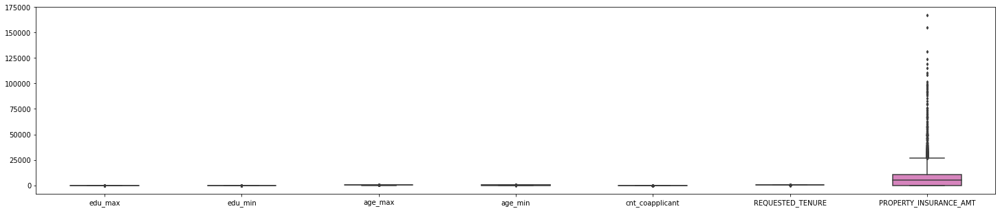

In [367]:
fig,ax = plt.subplots(figsize=(25,5))
sns.boxplot(data=data_cleaned.iloc[:,10:20],width=0.5,ax=ax, fliersize=3)


In [368]:
data_cleaned.shape

(12616, 177)

# VIF

In [384]:
x = data_cleaned.drop(['ever60_24m_StrictFlag_x','Dummy_application_id'],axis=1)

In [385]:
y = data_cleaned['ever60_24m_StrictFlag_x']

In [386]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12616 entries, 0 to 13337
Columns: 175 entries, NATURE_OF_ORGANISATION to Bureau_TL
dtypes: float64(66), int64(100), object(9)
memory usage: 16.9+ MB


In [387]:
Category =[]

for i in data_cleaned:
    if data_cleaned[i].dtype == 'object':
        Category.append(i)

In [388]:
Category

['NATURE_OF_ORGANISATION',
 'OCCUPATION_TYPE',
 'Organization_type',
 'SALARIED_SELF',
 'CHANNEL_CODE',
 'Loan_sub_type_1',
 'SAL_FLAG',
 'Latest_Bureau_prd',
 'Bureau_TL']

In [389]:
x = pd.get_dummies(x,columns=['NATURE_OF_ORGANISATION','OCCUPATION_TYPE','Organization_type','SALARIED_SELF','CHANNEL_CODE','Loan_sub_type_1','SAL_FLAG','Latest_Bureau_prd','Bureau_TL'],drop_first=True)

In [390]:
x.columns

Index(['Max_dependent', 'LTV', 'Doc_form_16', 'income_max', 'income_sum',
       'income_min', 'edu_max', 'edu_min', 'age_max', 'age_min',
       ...
       'Bureau_TL_12.>36 PL TWL GL', 'Bureau_TL_13.>36 Others',
       'Bureau_TL_2.<6 CC', 'Bureau_TL_3.<6 PL', 'Bureau_TL_4.<6 BL CL Oth',
       'Bureau_TL_5.<6 Others', 'Bureau_TL_6.<36 PL',
       'Bureau_TL_7.<36 AL HL LAS', 'Bureau_TL_8.<36 TWL GL',
       'Bureau_TL_9.<36 CC'],
      dtype='object', length=278)

In [391]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12616 entries, 0 to 13337
Columns: 278 entries, Max_dependent to Bureau_TL_9.<36 CC
dtypes: float64(66), int64(100), uint8(112)
memory usage: 17.4 MB


In [392]:
sc = StandardScaler()
x_scaled = sc.fit_transform(x)
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = x_scaled

vif = pd.DataFrame()

vif["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]

vif["Features"] = x.columns

C:\Users\infoa\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [382]:
vif

,VIF,Features
0,1.290031e+00,Dummy_application_id
1,1.097178e+00,Max_dependent
2,1.238389e+00,LTV
3,1.173471e+00,Doc_form_16
4,2.712132e+02,income_max
...,...,...
274,1.244441e+01,Bureau_TL_5.<6 Others
275,1.197223e+01,Bureau_TL_6.<36 PL
276,6.368926e+00,Bureau_TL_7.<36 AL HL LAS
277,2.498126e+01,Bureau_TL_8.<36 TWL GL


In [383]:
vif[vif['VIF']<2]

,VIF,Features
0,1.290031,Dummy_application_id
1,1.097178,Max_dependent
2,1.238389,LTV
3,1.173471,Doc_form_16
7,1.744904,edu_max
...,...,...
254,1.383446,Loan_sub_type_1_Resale Ready
255,1.674055,Loan_sub_type_1_Self Construction
263,1.915997,Latest_Bureau_prd_LAS
264,1.811718,Latest_Bureau_prd_OD/EL


In [393]:
x1 = list(vif['Features'])

In [394]:
x=x[x1]
x

,Max_dependent,LTV,Doc_form_16,income_max,income_sum,income_min,edu_max,edu_min,age_max,age_min,...,Bureau_TL_12.>36 PL TWL GL,Bureau_TL_13.>36 Others,Bureau_TL_2.<6 CC,Bureau_TL_3.<6 PL,Bureau_TL_4.<6 BL CL Oth,Bureau_TL_5.<6 Others,Bureau_TL_6.<36 PL,Bureau_TL_7.<36 AL HL LAS,Bureau_TL_8.<36 TWL GL,Bureau_TL_9.<36 CC
0,0,0.715563,0,11396.0000,11396.0000,0.0,3,2,46,24,...,0,0,1,0,0,0,0,0,0,0
1,2,0.544463,0,26472.0833,26472.0833,0.0,3,3,47,44,...,0,0,0,0,0,0,0,1,0,0
2,6,0.566012,0,23487.5000,23487.5000,0.0,3,3,35,35,...,1,0,0,0,0,0,0,0,0,0
3,0,0.536455,0,42270.0000,42270.0000,0.0,3,3,39,34,...,0,1,0,0,0,0,0,0,0,0
4,1,0.511949,0,17506.0000,17506.0000,0.0,3,3,32,28,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13333,3,0.797220,0,41202.0000,41202.0000,0.0,3,2,29,29,...,0,1,0,0,0,0,0,0,0,0
13334,1,0.799787,0,61858.0000,61858.0000,0.0,3,3,32,31,...,0,0,0,0,1,0,0,0,0,0
13335,0,0.506137,0,30616.6850,30616.6850,0.0,2,2,50,46,...,0,1,0,0,0,0,0,0,0,0
13336,0,0.155070,0,30616.6850,30616.6850,0.0,2,2,50,46,...,0,1,0,0,0,0,0,0,0,0


In [395]:
x_train,x_test,y_train,y_test =train_test_split(x,y,test_size=0.2,random_state =123)

In [396]:
from sklearn.preprocessing import MinMaxScaler

In [397]:
sc = MinMaxScaler()
x_train =sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [398]:
from sklearn.linear_model import LogisticRegression

logreg =LogisticRegression()

In [399]:
logreg.fit(x_train,y_train)

C:\Users\infoa\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [400]:
logreg.intercept_

array([-3.84707025])

In [401]:
logreg.coef_

array([[ 0.53743306,  2.09505079,  0.26551151,  0.13537652,  0.25322629,
         0.91168963, -0.21834581,  0.02889292,  0.4149165 ,  0.53573891,
        -0.32849405,  0.66060718, -0.54634746,  0.13514195, -0.17703416,
        -0.21403932, -0.1648017 , -0.49151153, -0.87687528, -0.18651527,
         0.97050308,  0.30061508, -0.39463858, -0.17923207, -0.6302852 ,
         0.32503138, -0.23409838, -0.14401762, -0.17067259, -0.15611309,
         0.53637326,  0.12357186, -0.69199728,  0.30796592,  0.23794528,
        -0.24576968,  0.52779843, -0.05705776, -0.01251176,  0.01373211,
         0.0174992 , -0.17440696, -0.52207335, -0.18041668,  0.42710397,
         0.11379728,  0.27541773,  0.08708122, -0.17388865, -0.31943917,
        -0.44562404,  0.75148579,  0.03587074,  0.70443567,  0.96686027,
        -0.27818542, -0.81953746, -0.37939412, -0.01980328, -0.37462605,
         0.64513586, -0.72832117, -0.29287515,  0.23715536,  0.10783094,
        -0.10115681, -0.12643257, -1.0842182 , -0.0

In [402]:
y_pred = logreg.predict(x_test)

In [403]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      2371
           1       0.55      0.04      0.07       153

    accuracy                           0.94      2524
   macro avg       0.74      0.52      0.52      2524
weighted avg       0.92      0.94      0.91      2524

